# Entonasyon Analizi

<a href="https://colab.research.google.com/drive/1cM91iqRx5j_XbzEU-vijYHdFS65k829N?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Entonasyon Analizi

Bir önceki defterimizde monofonik bir ses kaydında icra edilen ezgiyi sinyalin ardışık küçük kesitlerinde temel titreşim frekansı kestirimi yapıp bu değerlerden bir seri oluşturarak temsil etmiştik. Çizdirdiğimizde frekansın zamanla nasıl değiştiğini gözleyebildiğimiz bu dizilere frekans (zaman) serisi/dizisi adı verebiliriz. Bu defterde, ses sinyalinden otomatik analizle elde ettiğimiz bu dizilerin işlenmesini ele alacağız. 

Frekans dizilerinin işlendiği birçok müzik sinyal işleme problemi vardır. Örneğin frekans dizisinden yola çıkarak nota dizisi tespit etmek, otomatik notaya dökme işlemi gerçekleştirmek isteyebiliriz. Veya elimizde eserin notası var ise nota ile ses kaydı arasında bir hizalama (zamanda eşleme) işlemi yapmak isteyebiliriz. 

Bu defterde örnek uygulama olarak şu problemi ele alacağız: 
Klasik ve pop türünde Batı müziği kayıtları için nota frekanslarına dair yaygın kabul gören bir standart bulunmaktadır ve standart gerçek icra ile büyük oranda uyuşmaktadır. Ancak bu durum birçok müzik kültürü için geçerli değildir; bazı müzik kültürlerinde yaygın kabul gören standart bulunmamakta, bazılarında ise kabul gören standart bulunmakla beraber icra ile bazı yönlerden uyuşmazlık gözlenmektedir. İcra ile kuram arasında uyuşmazlıkların gözlendiği durumlarda ses sinyal işleme bize problemi tespit etme ve anlama konusunda yardımcı olabilir. 

Örneğin Türk makam müziğinde Hüzzam makamını ele alalım. Bu makamda icra edilen müzikal aralıkların (notaların frekansları arası oranlar/uzaklıklar) yaygın kullanılan kuramda açıklanan ile uyumlu olmadığına birçok kaynakta değinilmektedir ([örnek](https://islamansiklopedisi.org.tr/huzzam)). Bu makamda bir icranın kaydından yola çıkarak otomatik analiz ile kayıtta kullanılan müzikal aralıkları tespit edebilir miyiz? Bu defterimizde bu problemi ele alalım.

Bunun için ilk olarak bir dizi kısa kaydı indirecek, frekans kestirimi yapıp frekans serilerini elde edeceğiz. Aşağıdaki hücreleri çalıştırarak bu işlemi gerçekleştirin ve ses kayıtlarını dinleyin.


İlk olarak kütüphanelerimiz kurup yükleyelim:

In [ ]:
!pip install essentia 
import os 
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import essentia.standard as ess
from scipy import signal
import urllib.request
from IPython.display import Audio
import librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Hüzzam makamında 3 adet kayıt indirelim.

In [ ]:
baglantilar = {'Tanburi Cemil':'https://archive.org/download/cd_volumes-2-3_tanburi-cemil-bey/disc2/02.01.%20Tanburi%20Cemil%20Bey%20-%20Huzzam%20Taksim_sample.mp3',
               'Şükrü Tunar':'https://archive.org/download/cd_istanbul-1925_various-artists-deniz-kizikanuni-artaki-ha/disc1/01.%20Sukru%20Tunar%20-%20Huzzam%20Taksim_sample.mp3',
               'Udi Hrant':'https://archive.org/download/06UdiHrantKenkulianHzzamArkrBaharhGrmedenYazGeldiGedtiHoknadzDurtmadz/06%20-%20Udi%20Hrant%20Kenkulian%20-%20H%C3%BCzzam%20%C5%9Eark%C4%B1%20Bahar%C4%B1%20G%C3%B6rmeden%20Yaz%20Geldi%20Ge%C3%A7ti%20-%20Hoknadz%20Durtmadz.mp3'
              }
               
dosyalar = []
for muzisyen, link in baglantilar.items():
  dosya = muzisyen + '.mp3'
  dosyalar.append(dosya)
  urllib.request.urlretrieve(link, dosya)
  print(dosya, 'indirildi')


Tanburi Cemil.mp3 indirildi
Şükrü Tunar.mp3 indirildi
Udi Hrant.mp3 indirildi


Kayıtların ilk 30 saniyelik kısımlarını alarak Librosa.pyin fonksiyonu ile frekans serilerini elde edelim. Serileri çizdirelim.

In [ ]:
ornekleme_fr = 44100
max_uzunluk = 30 # saniye cinsinden maksimum uzunluk
minF0 = 50 # Hz cinsinden gözlenmesi beklenen minimum frekans
maxF0 = 800 # Hz cinsinden gözlenmesi beklenen maksimum frekans

frekans_serileri = {} # dosya ismi ile frekans serisini eşleyen bir kütüphane oluşturalım
print('PYIN frekans kestirimi gerçekleştiriliyor')
for dosya in dosyalar:
  muzik_sinyali = ess.MonoLoader(filename=dosya, sampleRate=ornekleme_fr)()

  # Sinyal uzun ise kırpalım
  muzik_sinyali = muzik_sinyali[:min(muzik_sinyali.size, int(max_uzunluk*ornekleme_fr))]

  # PYIN ile temel titreşim frekans kestirimi
  frekans_serisi_pyin, periyodiklik, periyodiklik_olasiligi = librosa.pyin(muzik_sinyali, fmin=minF0, fmax=maxF0, sr=ornekleme_fr)
  frekans_serileri[dosya] = frekans_serisi_pyin
  print(dosya, 'için frekans kestirimi tamamlandı')

PYIN frekans kestirimi gerçekleştiriliyor
Tanburi Cemil.mp3 için frekans kestirimi tamamlandı
Şükrü Tunar.mp3 için frekans kestirimi tamamlandı
Udi Hrant.mp3 için frekans kestirimi tamamlandı


Şimdi elde ettiğimiz frekans serilerini çizdirelim ve ses kayıtlarını dinleyelim.

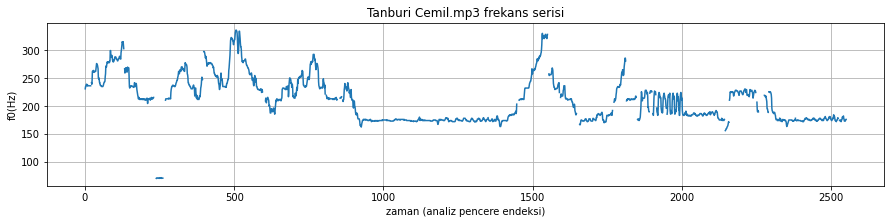

In [ ]:
dosya = dosyalar[0] # ilk kayıt

fig = plt.figure(figsize=(15,3))
plt.plot(frekans_serileri[dosya])
plt.title(dosya + " frekans serisi");
plt.xlabel('zaman (analiz pencere endeksi)');
plt.ylabel('f0(Hz)');
plt.grid()

Şekil 9.1: Tanburi Cemil kaydının temel titreşim frekans serisi

In [ ]:
muzik_sinyali = ess.MonoLoader(filename=dosya, sampleRate=ornekleme_fr)()
muzik_sinyali = muzik_sinyali[:min(muzik_sinyali.size, int(max_uzunluk*ornekleme_fr))]
Audio(muzik_sinyali, rate=ornekleme_fr)

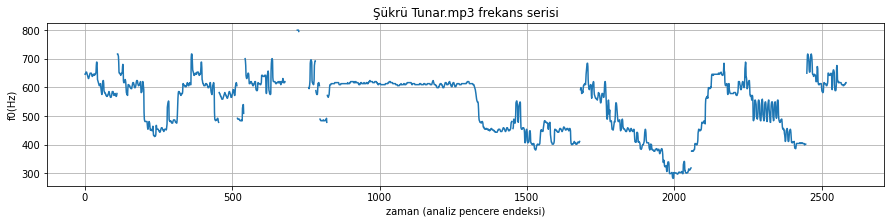

In [ ]:
dosya = dosyalar[1] # ikinci kayıt

fig = plt.figure(figsize=(15,3))
plt.plot(frekans_serileri[dosya])
plt.title(dosya + " frekans serisi");
plt.xlabel('zaman (analiz pencere endeksi)');
plt.ylabel('f0(Hz)');
plt.grid()

Şekil 9.2: Şükrü Tunar kaydının temel titreşim frekans serisi

In [ ]:
muzik_sinyali = ess.MonoLoader(filename=dosya, sampleRate=ornekleme_fr)()
muzik_sinyali = muzik_sinyali[:min(muzik_sinyali.size, int(max_uzunluk*ornekleme_fr))]
Audio(muzik_sinyali, rate=ornekleme_fr)

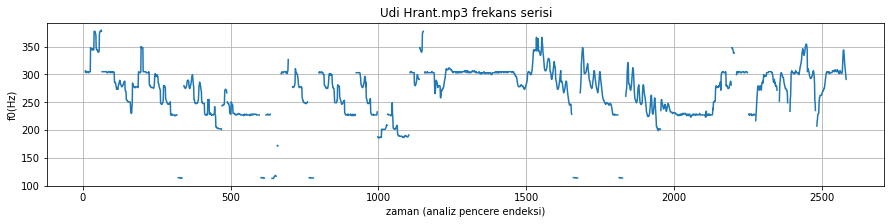

In [ ]:
dosya = dosyalar[2] # üçüncü kayıt

fig = plt.figure(figsize=(15,3))
plt.plot(frekans_serileri[dosya])
plt.title(dosya + " frekans serisi");
plt.xlabel('zaman (analiz pencere endeksi)');
plt.ylabel('f0(Hz)');
plt.grid()

Şekil 9.3: Udi Hrant kaydının temel titreşim frekans serisi

In [ ]:
muzik_sinyali = ess.MonoLoader(filename=dosya, sampleRate=ornekleme_fr)()
muzik_sinyali = muzik_sinyali[:min(muzik_sinyali.size, int(max_uzunluk*ornekleme_fr))]
Audio(muzik_sinyali, rate=ornekleme_fr)

Ezginin zamanla değişimini gösteren grafikler elde etmiş olduk. Peki kullanılan müzikal aralıkları nasıl ölçebiliriz? Bunun için frekans serilerindeki değerlerin histogramlarını (İng: pitch histogram) hesaplayıp inceleyebiliriz. (Histogram tanımı için [bakınız](https://en.wikipedia.org/wiki/Histogram). Frekans histogramlarının müzik araştırmalarında kullanımına dair bir araştırma makalesi için [bakınız](https://gcris.iyte.edu.tr/bitstream/11147/2760/1/2760.pdf)). İlk olarak kayıtların frekans histogramlarını çizdirip inceleyelim. Bu bize hangi frekansların sık kullanıldığına dair bilgi verecektir. Öncelikle nan değerleri dışarıda bırakıp daha sonra histogram hesaplıyor olacağız. 

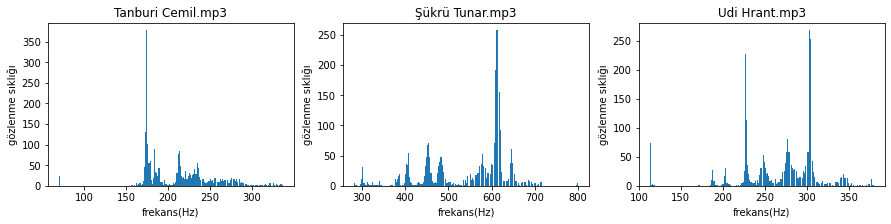

In [ ]:
fig = plt.figure(figsize=(15,3))
for n, dosya in enumerate(dosyalar): 
  plt.subplot(1,len(dosyalar), n+1)
  frekans_serisi = frekans_serileri[dosya]
  frekans_serisi = frekans_serisi[~np.isnan(frekans_serisi)]
  plt.hist(frekans_serisi, bins=200);
  plt.ylabel('gözlenme sıklığı')
  plt.xlabel('frekans(Hz)')
  plt.title(dosya)

Şekil 9.4: Kayıt frekans histogramları

Bir histogram gösteriminde y ekseni kullanım sıklığını temsil etmektedir. Örneğin son kayıt olan Tanburi Cemil.mp3 dosyasında en çok 175Hz civarı frekanslar (çok dik bir tepenin olduğu nokta) icra edilmiştir.

Dağılımlardan bazı frekansların sık kullanıldığını gözleyebiliyoruz. Bunları müzisyenin zihnindeki notaların merkezi frekansları olarak düşünebiliriz. Dağılımları birbiriyle karşılaştırmaya başlamadan, daha önce de kullandığımız bir dönüşümü uygulamalıyız: frekansı logaritmik bir eksende temsil etmeliyiz. Hatırlayalım: MIDI numaralarını hesaplarken belirli frekansa oran bilgisini logaritmik olarak temsil etmiştik. 5. defterimizde kullandığımız dönüşüm fonksiyonumuz şu idi: 

In [ ]:
def hz_den_midi(frekans_hz):
  midi_no = 69 + np.log2(frekans_hz/440) * 12
  return midi_no

Histogramları hesaplamadan önce Hz cinsinden frekans değerlerini logaritmik olan MIDI değerlerine dönüştürelim ve tüm histogramları aynı frekans aralığında (MIDI = [40, 80]) çizdirelim. MIDI numarası tanım itibariyle piyanodaki klavye endekslerine denk gelen tamsayı değerlerdi ancak burada frekans uzayının logaritmik bir temsili olarak ele alacak ve ondalık sayılar kullanacağız. Bir nevi, piyanodaki tuşları çok küçük parçalara böldüğümüzü ve daha küçük adımlarla ilerlenen ve çok çok fazla sayıda tuş içeren bir piyano üzerinden bir temsil gerçekleştirdiğimizi düşünebilirsiniz.

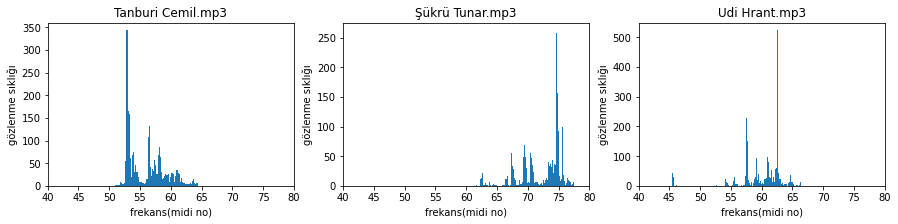

In [ ]:
fig = plt.figure(figsize=(15,3))
for n, dosya in enumerate(dosyalar): 
  plt.subplot(1,len(dosyalar), n+1)
  frekans_serisi = frekans_serileri[dosya]
  frekans_serisi = frekans_serisi[~np.isnan(frekans_serisi)]
  plt.hist(hz_den_midi(frekans_serisi), bins=150);
  plt.ylabel('gözlenme sıklığı')
  plt.xlabel('frekans(MIDI no)')
  plt.xlim([40,80])
  plt.title(dosya)

Şekil 9.4: Kayıt frekans histogramları (frekans logaritmik skalada (MIDI no) temsil edilmiştir)

Dağılımların frekans uzayında farklı bölgelerde olduğunu görüyoruz. Müzisyen kendi tercih ettiği frekans aralığında (Türk makam müziği terminolojisiyle ifade etmek gerekirse, üç müzisyen *farklı âhenklerde*) icra etmişlerdir. O nedenle, farklı icraları karşılaştırabilmek için frekans ekseninde kaydırmalar yapmamız gerekecek. Aşağıda, histogramlar arasında bir ilişki olduğunu göstermek için elle kaydırılmış sürümlerini üstüste çizdiriyoruz. Kaydırma miktarlarını makam dizisi bilgisi ve histogram şeklinden yola çıkarak belirledik. 

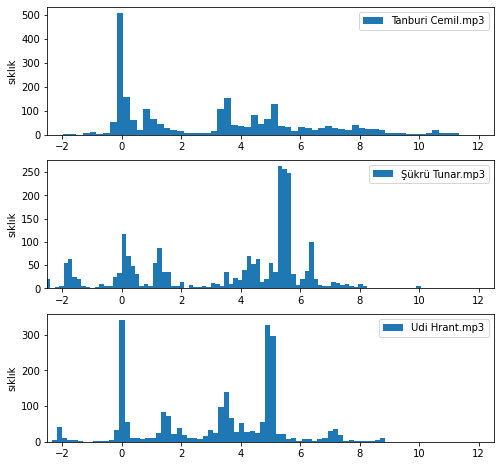

In [ ]:
segah_perdesi_pozisyonlari = [53, 69.3, 57.6]
fig = plt.figure(figsize=(8,8))
for n, dosya in enumerate(dosyalar): 
  plt.subplot(len(dosyalar),1, n+1)
  frekans_serisi = frekans_serileri[dosya]
  frekans_serisi = frekans_serisi[~np.isnan(frekans_serisi)]
  plt.hist(hz_den_midi(frekans_serisi)-segah_perdesi_pozisyonlari[n], bins=120, label=dosya);
  plt.ylabel('sıklık')
  plt.xlim([-2.5,12.5])
  plt.legend()


Şekil 9.5: Kaydırılmış/Transpoze edilmiş kayıt frekans histogramları (frekans logaritmik skalada (MIDI no) temsil edilmiştir)

Kaydırılmış histogramları karşılaştırdığımızda sıklıkları değişmekle beraber tepelerin yerlerinin birbirine yakın (ama farklı) yerlerde olduğunu görebiliyoruz. Bu, müzisyenlerin makam aynı olsa da farklı müzikal aralıkları tercih ettiğini gösteriyor. Şimdi frekans temsilinde MIDI numaraları kullanmak yerine yine yaygın kullanılan logaritmik temsillerden birisi olan sent (İng: [cent](https://en.wikipedia.org/wiki/Cent_(music))) birimini kullanalım. Sent bir oktavlık frekans bandının logaritmik olarak 1200 eşit parçaya bölünmesi ile elde edilen birimdir. Histogramı hesaplarken de 20 sentlik aralıklar içerisindeki icra sıklıklarını hesaplayacağız. Ayrıca histogramlarımızı, 2. defterimizde tanımlayıp kullandığımız şekilde, düşük geçiren filtreden geçirerek anlık küçük varyasyonları dışarıda bırakacağız.

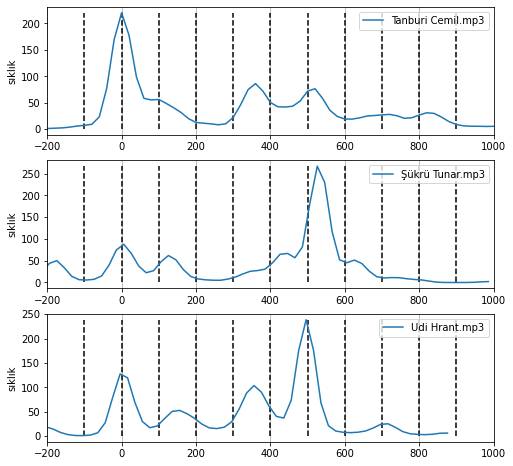

In [ ]:
def dusuk_geciren_filtre(filtrelenecek_seri, uzunluk_h_n, normalize_kesim_frekansi):
  h_n = signal.firwin(uzunluk_h_n, normalize_kesim_frekansi)
  filtrelenmis_seri = np.convolve(filtrelenecek_seri, h_n)
  # Konvolusyon işlemi sonucu sinyalimiz uzadı, keselim
  filtrelenmis_seri = filtrelenmis_seri[int(uzunluk_h_n//2):int(uzunluk_h_n//2) + filtrelenecek_seri.size]
  return filtrelenmis_seri

def hz_den_sent(frekans_hz, referans_frekansi):
  return np.log2(frekans_hz / referans_frekansi) * 1200

referans_frekans = 110 # referans frekansını serideki çoğu değerden düşük rasgele bir değer olarak seçtik, fark hesaplayacağımız için önemi yok
segah_perdesi_pozisyonlari = [795,2439,1259] # gözlemle bulunan değerler
hist_aralik_adimi = 20 # histogramı 20 sent adımlarla hesaplayacağız
# Filtre tasarım parametreleri
uzunluk_h_n = 7; normalize_kesim_frekansi = 0.25
fig = plt.figure(figsize=(8,8))
for n, dosya in enumerate(dosyalar): 
  plt.subplot(len(dosyalar),1, n+1)
  frekans_serisi = frekans_serileri[dosya]
  frekans_serisi = frekans_serisi[~np.isnan(frekans_serisi)]
  # Hz-> sent dönüşüm
  frekans_sent = hz_den_sent(frekans_serisi, referans_frekans) 
  # Frekans ekseninde kaydırma
  frekans_sent -= segah_perdesi_pozisyonlari[n]
  # Histogram hesabı
  histogram_araliklari = np.arange(np.min(frekans_sent), np.max(frekans_sent)+hist_aralik_adimi, hist_aralik_adimi)
  degerler, araliklar = np.histogram(frekans_sent, bins = histogram_araliklari)
  # Histogramın küçük varyasyonlarını dışarıda bırakmak için filtreleyelim
  degerler = dusuk_geciren_filtre(degerler, uzunluk_h_n, normalize_kesim_frekansi)
  aralik_orta_noktalari = (histogram_araliklari[:-1] + histogram_araliklari[1:]) / 2
  plt.plot(aralik_orta_noktalari, degerler, label=dosya);
  plt.ylabel('sıklık')
  plt.xlim([-200,1000])
  plt.legend()
  plt.grid('minor', axis='x')
  plt.vlines(np.arange(-100,1000,100), 0, np.max(degerler), linestyle='dashed')


Şekil 9.6: Kaydırılmış/Transpoze edilmiş ve düşük geçiren filtre ile filtrelenmiş kayıt frekans histogramları (frekans logaritmik skalada (sent) temsil edilmiştir)

Histogramları çizdirirken;

*   Frekans uzayında kaydırdık (transpoze ettik)
*   Standart Batı müziği sesleriyle uyuşma düzeyini gözlemek için segah perdesini 0 noktasına denk getirerek her 100 sent'te bir dikey çizgi ekledik

Çizimlerde dikey çizgiler batı müziği eşit yedirimli standart ses sistemi nota frekanlarının yerlerini, histogramda bulunan tepeler ise müzisyenin en sık bastığı ve ilgili notayı temsil edecek frekanslar olarak düşünülebilir. Birçok noktada tepe noktaları ile dikey çizgilerin örtüşmediğini, diğer bir deyişle kullanılan müzikal aralıkların farklı olduğunu gözleyebiliyoruz.  

Konu ilginizi çekti ise; 


*   Bir kayıttan yola çıkarak, kayıttaki nota frekanslarını otomatik bulan, bu değerleri bir dijital klavyenin tuşlarına atayarak bilgisayarınızda bu sesleri denemenizi sağlayan bir kod örneği için [MTG-MIR ders notları 4.3](https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture4_3_tuningAnalysis_SingleRecording.ipynb)'e, 
*   Bu işlemi birçok kayıttan yola çıkarak, kayıtların ortalama dağılımları üzerinden gerçekleştiren bir kod örneği için [MTG-MIR ders notları 4.4](https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture4_4_tuningAnalysis_SetOfRecordings.ipynb)'e bakabilirsiniz. 
*   Tanburi Cemil Bey kayıtları üzerine yapılmış bazı analizlerin sonuçlarına ulaşmak için [bakınız](https://sites.google.com/view/frekansolcummakam/ana-sayfa).
*   Çok sayıda kayıt üzerinden yapılan analizlerden elde edilen müzikal aralıklar ile makam müziği kuramlarının tanımladığı aralıklar arasında bir karşılaştırma için [bakınız](https://avesis.metu.edu.tr/yayin/9836ab43-8721-4454-8820-e910f3d666b3/weighing-diverse-theoretical-models-on-turkish-maqam-music-against-pitch-measurements-a-comparison-of-peaks-automatically-derived-from-frequency-histograms-with-proposed-scale-tones/document.pdf).
*   Bu defterde ve yukarıdaki içeriklerde açıklanan temel fikrin üzerine kurulu bir akort uygulaması için [bakınız](https://play.google.com/store/apps/details?id=com.meskteknoloji.mesktune&hl=tr&gl=US)

**Kaynakça:** Bu defter hazırlanırken Barış Bozkurt tarafından daha önce hazırlanmış [MTG-MIR ders notları 4.3](https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture4_3_tuningAnalysis_SingleRecording.ipynb) ve ["Tutorial on Computational Approaches for Analysis of Non-Western Music Traditions"](https://www.upf.edu/web/mtg/non-western-music-tutorial), 19th ISMIR Conference, Paris, 23/09/2018 kaynakları kullanılmıştır.


**Yazar:** Barış Bozkurt, **editör:** Ahmet Uysal

---